<img src=https://i.imgur.com/WKQ0nH2.jpg height=350>

# Setup and Context


### Introduction

Welcome to Boston Massachusetts in the 1970s! Imagine you're working for a real estate development company. Your company wants to value any residential project before they start. You are tasked with building a model that can provide a price estimate based on a home's characteristics like:
* The number of rooms - 방의 개수
* The distance to employment centres - 고용 센터까지의 거리
* How rich or poor the area is - 지역의 경제력 수준
* How many students there are per teacher in local schools etc - 지역 학교의 교사당 학생 수 등

<img src=https://i.imgur.com/WfUSSP7.png height=350>

To accomplish your task you will:

1. Analyse and explore the Boston house price data
2. Split your data for training and testing
3. Run a Multivariable Regression
4. Evaluate how your model's coefficients and residuals
5. Use data transformation to improve your model performance
6. Use your model to estimate a property price

# 목표
1. 보스턴 집의 가격 데이터를 분석, 연구하고
2. 데이터를 훈련용과 테스트용으로 나누고
3. 다변수 회귀 분석을 수행할 것입니다.
4. 또 모델의 계수와 잔차를 평가하고
5. 모델 성능을 개선하기 위해 데이터 변환을 이용하고
6. 모델을 이용해 부동산 가격을 감정할 것입니다.



### Upgrade plotly (only Google Colab Notebook)

Google Colab may not be running the latest version of plotly. If you're working in Google Colab, uncomment the line below, run the cell, and restart your notebook server. 

In [1]:
# %pip install --upgrade plotly

###  Import Statements


In [2]:
import pandas as pd
import numpy as np

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
# TODO: Add missing import statements

### Notebook Presentation

In [3]:
pd.options.display.float_format = '{:,.2f}'.format

# Load the Data

The first column in the .csv file just has the row numbers, so it will be used as the index. 

In [5]:
data = pd.read_csv('boston.csv', index_col=0)
print(data)

     CRIM    ZN  INDUS  CHAS  NOX   RM   AGE  DIS  RAD    TAX  PTRATIO      B  \
0    0.01 18.00   2.31  0.00 0.54 6.58 65.20 4.09 1.00 296.00    15.30 396.90   
1    0.03  0.00   7.07  0.00 0.47 6.42 78.90 4.97 2.00 242.00    17.80 396.90   
2    0.03  0.00   7.07  0.00 0.47 7.18 61.10 4.97 2.00 242.00    17.80 392.83   
3    0.03  0.00   2.18  0.00 0.46 7.00 45.80 6.06 3.00 222.00    18.70 394.63   
4    0.07  0.00   2.18  0.00 0.46 7.15 54.20 6.06 3.00 222.00    18.70 396.90   
..    ...   ...    ...   ...  ...  ...   ...  ...  ...    ...      ...    ...   
501  0.06  0.00  11.93  0.00 0.57 6.59 69.10 2.48 1.00 273.00    21.00 391.99   
502  0.05  0.00  11.93  0.00 0.57 6.12 76.70 2.29 1.00 273.00    21.00 396.90   
503  0.06  0.00  11.93  0.00 0.57 6.98 91.00 2.17 1.00 273.00    21.00 396.90   
504  0.11  0.00  11.93  0.00 0.57 6.79 89.30 2.39 1.00 273.00    21.00 393.45   
505  0.05  0.00  11.93  0.00 0.57 6.03 80.80 2.50 1.00 273.00    21.00 396.90   

     LSTAT  PRICE  
0     4

### Understand the Boston House Price Dataset

---------------------------

**Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. The Median Value (attribute 14) is the target.

    :Attribute Information (in order):
        1. CRIM     per capita crime rate by town
        2. ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        3. INDUS    proportion of non-retail business acres per town
        4. CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        5. NOX      nitric oxides concentration (parts per 10 million)
        6. RM       average number of rooms per dwelling
        7. AGE      proportion of owner-occupied units built prior to 1940
        8. DIS      weighted distances to five Boston employment centres
        9. RAD      index of accessibility to radial highways
        10. TAX      full-value property-tax rate per $10,000
        11. PTRATIO  pupil-teacher ratio by town
        12. B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
        13. LSTAT    % lower status of the population
        14. PRICE     Median value of owner-occupied homes in $1000's
        
    :Missing Attribute Values: None

    :Creator: Harrison, D. and Rubinfeld, D.L.

This is a copy of [UCI ML housing dataset](https://archive.ics.uci.edu/ml/machine-learning-databases/housing/). This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University. You can find the [original research paper here](https://deepblue.lib.umich.edu/bitstream/handle/2027.42/22636/0000186.pdf?sequence=1&isAllowed=y). 


### Understand the Boston House Price Dataset

---------------------------

**Characteristics:**

    :Number of Instances: 506

    :속성 수: 13개 (예측 변수), 목표 변수(집값) 포함 총 14개,  주택의 중간 가격 (`PRICE`, 단위: $1000)

    :Attribute Information (in order):
        1. CRIM     지역별 1인당 범죄율
        2. ZN       25,000 평방피트 이상 주거지역 비율
        3. INDUS    비소매 상업 지역 면적 비율
        4. CHAS     찰스강 인접 여부 (`1`: 인접, `0`: 비인접)
        5. NOX      대기 중 일산화질소 농도 (10ppm 단위)
        6. RM       주택 1가구당 평균 방 개수
        7. AGE      1940년 이전에 건설된 자가 주택 비율
        8. DIS      5개 주요 고용센터까지의 가중 거리
        9. RAD      방사형 고속도로 접근성 지수
        10. TAX      $10,000당 재산세율
        11. PTRATIO  지역별 학생-교사 비율
        12. B        1000(Bk - 0.63)^2 (`Bk`: 지역별 흑인 비율)
        13. LSTAT    지역 내 저소득층 비율 (%)
        14. PRICE    자가 주택의 중간 가격 (단위: $1000)

    :Missing Attribute Values: None

    :Creator: Harrison, D. and Rubinfeld, D.L.

This is a copy of [UCI ML housing dataset](https://archive.ics.uci.edu/ml/machine-learning-databases/housing/). This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University. You can find the [original research paper here](https://deepblue.lib.umich.edu/bitstream/handle/2027.42/22636/0000186.pdf?sequence=1&isAllowed=y).


# Preliminary Data Exploration 🔎

**Challenge**

* What is the shape of `data`? 
* How many rows and columns does it have?
* What are the column names?
* Are there any NaN values or duplicates?

In [16]:
# What is the shape of data?
print(f"DATA:\n {data}")

# How many rows and columns does it have?
print(f"DATA SHAPE: \n {data.shape}")

# What are the column names?
print(f"DATA COLUMNS NAME: \n {data.columns}")

DATA:
      CRIM    ZN  INDUS  CHAS  NOX   RM   AGE  DIS  RAD    TAX  PTRATIO      B  \
0    0.01 18.00   2.31  0.00 0.54 6.58 65.20 4.09 1.00 296.00    15.30 396.90   
1    0.03  0.00   7.07  0.00 0.47 6.42 78.90 4.97 2.00 242.00    17.80 396.90   
2    0.03  0.00   7.07  0.00 0.47 7.18 61.10 4.97 2.00 242.00    17.80 392.83   
3    0.03  0.00   2.18  0.00 0.46 7.00 45.80 6.06 3.00 222.00    18.70 394.63   
4    0.07  0.00   2.18  0.00 0.46 7.15 54.20 6.06 3.00 222.00    18.70 396.90   
..    ...   ...    ...   ...  ...  ...   ...  ...  ...    ...      ...    ...   
501  0.06  0.00  11.93  0.00 0.57 6.59 69.10 2.48 1.00 273.00    21.00 391.99   
502  0.05  0.00  11.93  0.00 0.57 6.12 76.70 2.29 1.00 273.00    21.00 396.90   
503  0.06  0.00  11.93  0.00 0.57 6.98 91.00 2.17 1.00 273.00    21.00 396.90   
504  0.11  0.00  11.93  0.00 0.57 6.79 89.30 2.39 1.00 273.00    21.00 393.45   
505  0.05  0.00  11.93  0.00 0.57 6.03 80.80 2.50 1.00 273.00    21.00 396.90   

     LSTAT  PRICE  


In [17]:
#  Are there any NaN values or duplicates?
print(f"NaN값 여부: \n {data.isna().values.any()}")
print(f"Duplicated값 여부: \n {data.duplicated().values.any()}")

NaN값 여부: 
 False
Duplicated값 여부: 
 False


## Data Cleaning - Check for Missing Values and Duplicates

In [18]:
print("결측값 확인:")
print(data.isnull().sum())

결측값 확인:
CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
PRICE      0
dtype: int64


In [19]:
print("\n중복값 확인:")
print(data.duplicated().sum())


중복값 확인:
0


In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  PRICE    506 non-null    float64
dtypes: float64(14)
memory usage: 59.3 KB


## Descriptive Statistics

**Challenge**

* How many students are there per teacher on average?
* What is the average price of a home in the dataset?
* What is the `CHAS` feature? 
* What are the minimum and the maximum value of the `CHAS` and why?
* What is the maximum and the minimum number of rooms per dwelling in the dataset?

In [33]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
count,506.00,506.00,506.00,506.00,506.00,506.00,506.00,506.00,506.00,506.00,506.00,506.00,506.00,506.00
mean,3.61,11.36,11.14,0.07,0.55,6.28,68.57,3.80,9.55,408.24,18.46,356.67,12.65,22.53
std,8.60,23.32,6.86,0.25,0.12,0.70,28.15,2.11,8.71,168.54,2.16,91.29,7.14,9.20
min,0.01,0.00,0.46,0.00,0.39,3.56,2.90,1.13,1.00,187.00,12.60,0.32,1.73,5.00
25%,0.08,0.00,5.19,0.00,0.45,5.89,45.02,2.10,4.00,279.00,17.40,375.38,6.95,17.02
50%,0.26,0.00,9.69,0.00,0.54,6.21,77.50,3.21,5.00,330.00,19.05,391.44,11.36,21.20
75%,3.68,12.50,18.10,0.00,0.62,6.62,94.07,5.19,24.00,666.00,20.20,396.23,16.96,25.00
max,88.98,100.00,27.74,1.00,0.87,8.78,100.00,12.13,24.00,711.00,22.00,396.90,37.97,50.00


In [27]:
#  How many students are there per teacher on average?
avg_students_per_teacher = data['PTRATIO'].mean()
print(f"교사 1인당 평균 학생 비율: {avg_students_per_teacher:.2f}")

교사 1인당 평균 학생 비율: 18.46


In [31]:
# What is the average price of a home in the dataset?
avg_price_home = data['PRICE'].mean()
print(f"평균 주택 가격: {avg_price_home:.2f} (단위: $1000)")

평균 주택 가격: 22.53 (단위: $1000)


In [34]:
# What is the `CHAS` feature?
# What are the minimum and the maximum value of the `CHAS` and why?
min_chas = data["CHAS"].min()
max_chas = data["CHAS"].max()
print(f"CHAS 최소값: {min_chas}, 최대값: {max_chas}")

CHAS 최소값: 0.0, 최대값: 1.0


# CHAS는 찰스강 인접 여부를 나타내는 더미 변수(dummy variable).
- 1이면 찰스강과 인접한 지역
- 0이면 비인접한 지역

In [39]:
# What is the maximum and the minimum number of rooms per dwelling in the dataset?
min_rooms = data['RM'].min()
max_rooms = data['RM'].max()
print(f"최소 방 개수: {min_rooms}, 최대 방 개수: {max_rooms}")

최소 방 개수: 3.561, 최대 방 개수: 8.78


## Visualise the Features

**Challenge**: Having looked at some descriptive statistics, visualise the data for your model. Use [Seaborn's `.displot()`](https://seaborn.pydata.org/generated/seaborn.displot.html#seaborn.displot) to create a bar chart and superimpose the Kernel Density Estimate (KDE) for the following variables: 
* PRICE: The home price in thousands.
* RM: the average number of rooms per owner unit.
* DIS: the weighted distance to the 5 Boston employment centres i.e., the estimated length of the commute.
* RAD: the index of accessibility to highways. 

Try setting the `aspect` parameter to `2` for a better picture. 

What do you notice in the distributions of the data? 

#### House Prices 💰

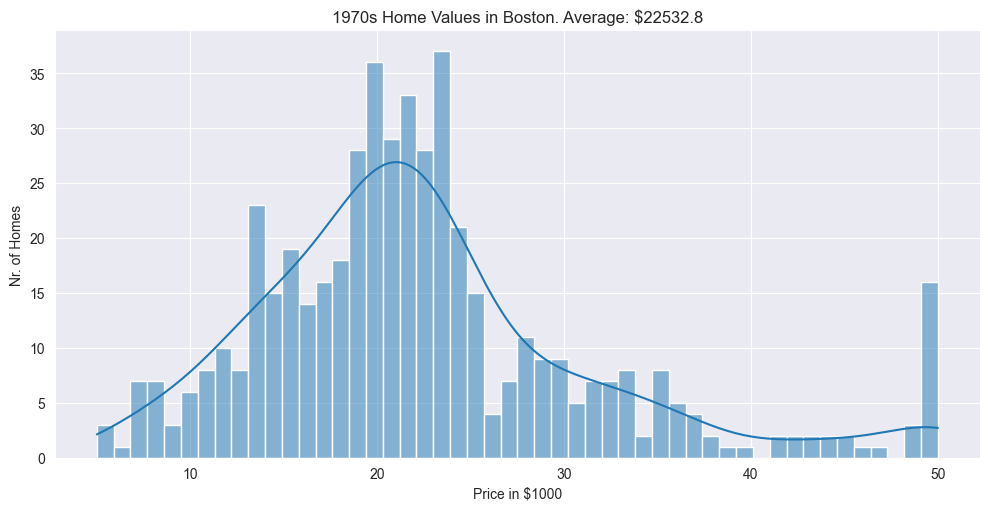

In [50]:
sns.displot(data["PRICE"],
            kde=True,
            bins=50,
            aspect=2,)
plt.title(f"1970s Home Values in Boston. Average: ${(1000*data.PRICE.mean()):.6}")
plt.xlabel('Price in $1000')
plt.ylabel('Nr. of Homes')

plt.show()

#### Distance to Employment - Length of Commute 🚗

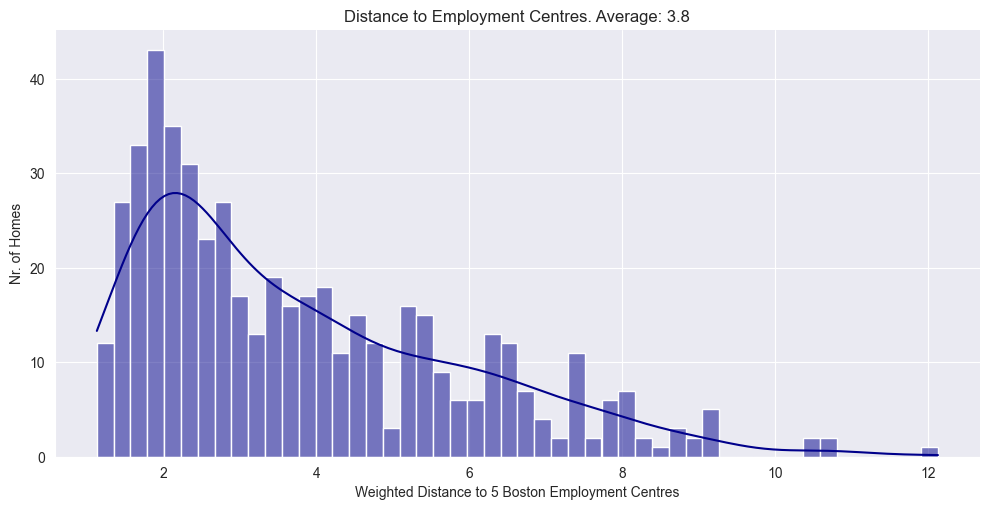

In [49]:
sns.displot(data["DIS"],
            kde=True,
            bins=50,
            aspect=2,
            color="darkblue")
plt.title(f'Distance to Employment Centres. Average: {(data.DIS.mean()):.2}')
plt.xlabel('Weighted Distance to 5 Boston Employment Centres')
plt.ylabel('Nr. of Homes')

plt.show()

#### Number of Rooms

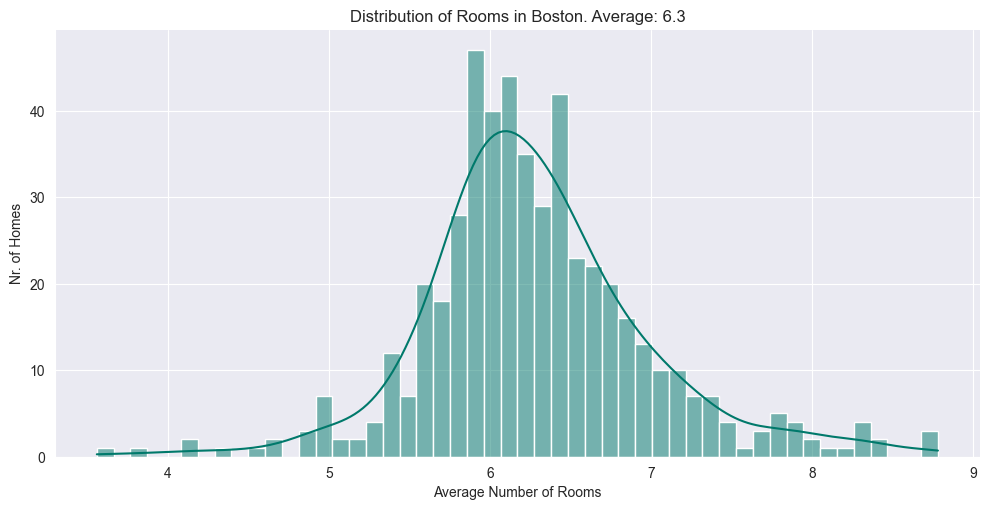

In [54]:
sns.displot(data["RM"],
            kde=True,
            bins=50,
            aspect=2,
            color='#00796b')

plt.title(f'Distribution of Rooms in Boston. Average: {data.RM.mean():.2}')
plt.xlabel('Average Number of Rooms')
plt.ylabel('Nr. of Homes')

plt.show()

#### Access to Highways 🛣

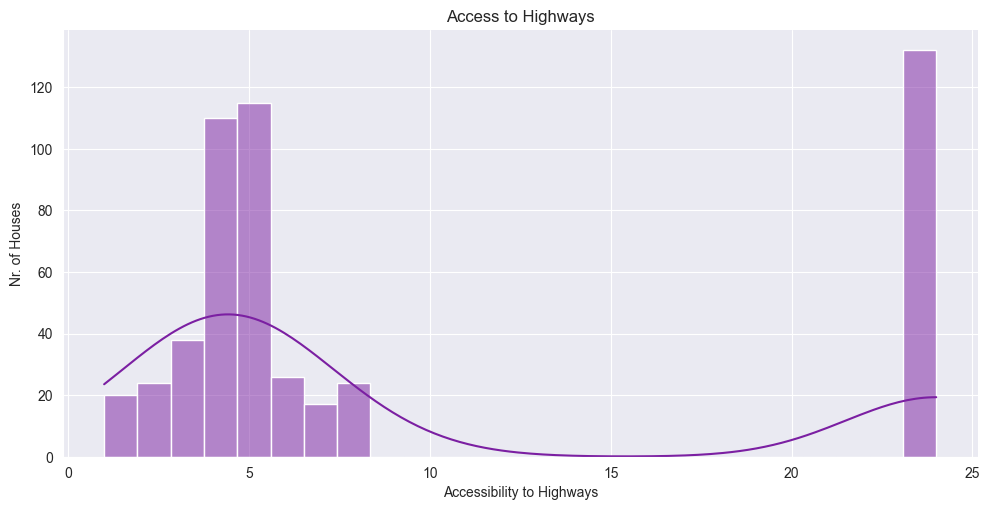

In [60]:
# RAD 변수에 대한 히스토그램 및 KDE 플롯 생성
sns.displot(
    data["RAD"],  # 데이터셋에서 'RAD' 컬럼 선택 (고속도로 접근성 지수)
    kde=True,  # KDE (Kernel Density Estimate) 곡선 추가하여 분포를 부드럽게 시각화
    bins=25,  # 히스토그램의 막대(bin) 개수를 20개로 설정
    aspect=2,  # 그래프의 가로 비율을 늘려 더 넓게 표시
    color='#7b1fa2'  # 그래프 색상 지정 (보라색 계열)
)

# 그래프 제목 설정
plt.title(f'Access to Highways')
# x축 레이블 (축 이름) 설정
plt.xlabel('Accessibility to Highways')
# y축 레이블 (축 이름) 설정
plt.ylabel('Nr. of Houses')
plt.show()

#### Next to the River? ⛵️

**Challenge**

Create a bar chart with plotly for CHAS to show many more homes are away from the river versus next to it. The bar chart should look something like this:

<img src=https://i.imgur.com/AHwoQ6l.png height=350>

You can make your life easier by providing a list of values for the x-axis (e.g., `x=['No', 'Yes']`)

In [64]:
river_access = data['CHAS'].value_counts()
print(river_access)

CHAS
0.00    471
1.00     35
Name: count, dtype: int64


In [63]:
bar = px.bar(x=['No', 'Yes'],
             y=river_access.values,
             color=river_access.values,
             color_continuous_scale=px.colors.sequential.haline,
             title='Next to Charles River?')

bar.update_layout(xaxis_title='Property Located Next to the River?',
                  yaxis_title='Number of Homes',
                  coloraxis_showscale=False)
bar.show()

<img src=https://i.imgur.com/b5UaBal.jpg height=350>

# Understand the Relationships in the Data

### Run a Pair Plot

**Challenge**

There might be some relationships in the data that we should know about. Before you run the code, make some predictions:

* What would you expect the relationship to be between pollution (NOX) and the distance to employment (DIS)? 
* What kind of relationship do you expect between the number of rooms (RM) and the home value (PRICE)?
* What about the amount of poverty in an area (LSTAT) and home prices? 

Run a [Seaborn `.pairplot()`](https://seaborn.pydata.org/generated/seaborn.pairplot.html?highlight=pairplot#seaborn.pairplot) to visualise all the relationships at the same time. Note, this is a big task and can take 1-2 minutes! After it's finished check your intuition regarding the questions above on the `pairplot`. 

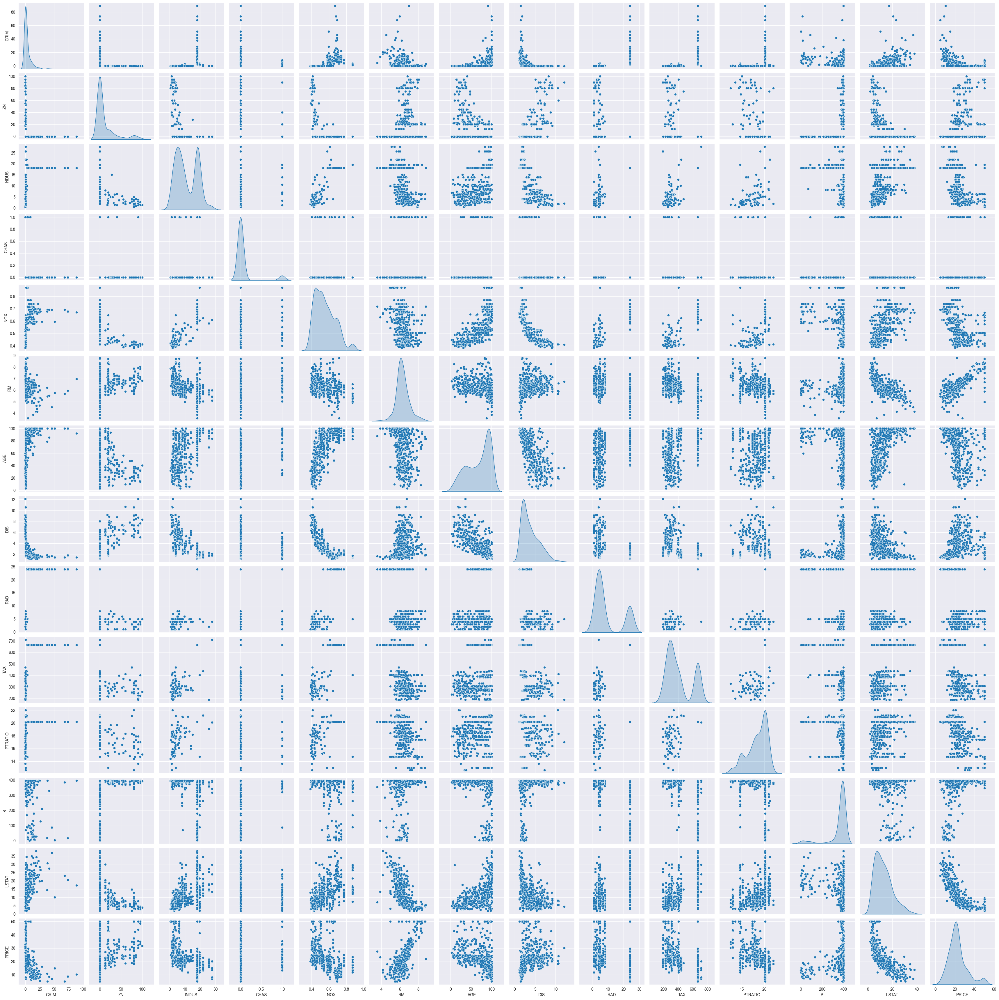

In [66]:
sns.pairplot(data=data, diag_kind="kde")

plt.show()

**Challenge**

Use [Seaborn's `.jointplot()`](https://seaborn.pydata.org/generated/seaborn.jointplot.html) to look at some of the relationships in more detail. Create a jointplot for:

* DIS and NOX
* INDUS vs NOX
* LSTAT vs RM
* LSTAT vs PRICE
* RM vs PRICE

Try adding some opacity or `alpha` to the scatter plots using keyword arguments under `joint_kws`.

#### Distance from Employment vs. Pollution

**Challenge**: 

Compare DIS (Distance from employment) with NOX (Nitric Oxide Pollution) using Seaborn's `.jointplot()`. Does pollution go up or down as the distance increases? 

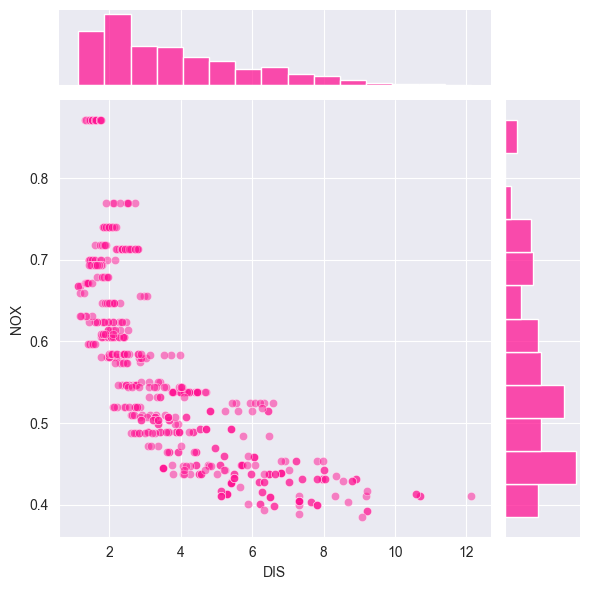

In [77]:
sns.jointplot(x=data["DIS"],
              y=data["NOX"],
              kind="scatter",
              height=6,
              alpha=0.5,
              color='deeppink',
              joint_kws={'alpha': 0.5})
plt.show()

# 🔍 1️⃣ 주요 패턴 (상관관계)
* 음의 상관관계 (Negative Correlation):
* DIS(고용센터와의 거리)가 커질수록 NOX(대기오염 농도)가 감소하는 경향이 보임.
```
즉, 고용센터(도심)에서 가까울수록(NO 높음) 공해가 심함, 멀어질수록(NO 낮음) 공해가 줄어듦.
이는 공업지대나 상업지역이 도심 근처에 많고, 교통량이 많아 공해가 높기 때문이라고 해석할 수 있음.
```
# 📌 2️⃣ 그래프 구성 요소

* 산점도(Scatter Plot) 중앙 부분:
* DIS(고용센터 거리) 값이 작을수록(도심에 가까울수록) NOX(공해) 값이 높음.
* 오른쪽으로 갈수록(도심에서 멀어질수록) NOX 값이 낮아짐.
```
주변 히스토그램 (Marginal Histogram)
상단 히스토그램 → DIS(거리)의 분포를 보여줌. 도심 가까운 지역이 상대적으로 많음.
오른쪽 히스토그램 → NOX(공해)의 분포를 보여줌. 공해가 낮은 지역이 더 많은 것으로 보임.
```

#### Proportion of Non-Retail Industry 🏭🏭🏭 versus Pollution 

**Challenge**: 

Compare INDUS (the proportion of non-retail industry i.e., factories) with NOX (Nitric Oxide Pollution) using Seaborn's `.jointplot()`. Does pollution go up or down as there is a higher proportion of industry?

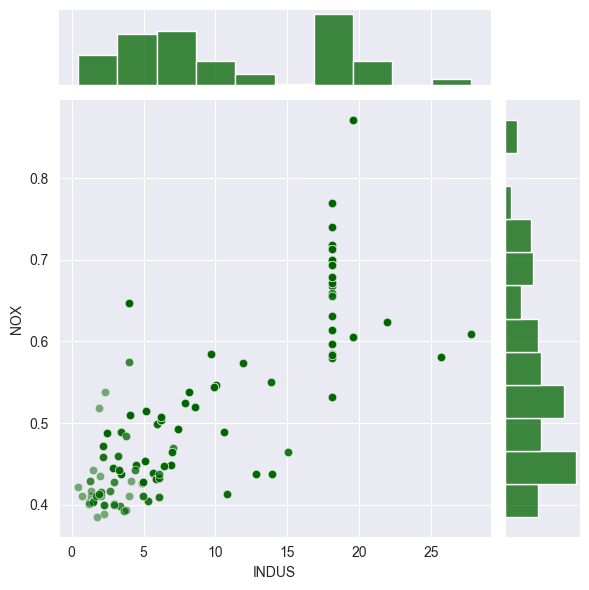

In [76]:
sns.jointplot(x=data["INDUS"],
              y=data["NOX"],
              kind="scatter",
              height=6,
              alpha=0.5,
              color='darkgreen',
              joint_kws={'alpha': 0.5})
plt.show()

# 🔍 1️⃣ 주요 패턴 분석
* ✅ INDUS(산업 지역 비율)가 증가할수록 NOX(대기오염)도 증가하는 경향
```
X축: INDUS (비소매 상업 지역 비율)
Y축: NOX (일산화질소 공해 농도)
```
* 양의 상관관계(Positive Correlation)가 존재함.
```
산업 지역 비율이 낮은 곳에서는 공해(NO)가 낮은 값(약 0.4~0.5)에서 분포함.
INDUS 값이 1025 이상으로 증가할수록 NOX가 0.60.8 수준으로 상승하는 경향이 보임.
```
* ✅ 특정 구간에서 NOX 값이 수직으로 정렬된 패턴이 보임
```
INDUS 값이 약 18~25 근처에서 NOX 값이 동일한 값에 수직으로 정렬되는 현상이 나타남.
이는 특정 지역의 데이터 값이 산업 비율에 따라 일정한 공해 수준을 유지하고 있을 가능성이 있음.
해당 구간은 도시 내 특정한 상업/산업 지역을 나타낼 수도 있음.
```

# 📌 2️⃣ 주변 히스토그램 (Marginal Histogram) 분석
* 상단 히스토그램 (INDUS 분포)
```
대부분의 지역이 INDUS 값이 낮음 (~10 이하).
일부 지역에서 INDUS 값이 20 이상으로 높아지는 경우가 있음.
```
* 오른쪽 히스토그램 (NOX 분포)
```
공해(NOX) 값이 0.4~0.6 범위에서 주로 분포하지만, 일부 지역에서는 0.7~0.8로 치솟음.
이는 공업/산업 지역에서 공해가 상대적으로 높은 지역이 존재함을 의미.
```

#### % of Lower Income Population vs Average Number of Rooms

**Challenge** 

Compare LSTAT (proportion of lower-income population) with RM (number of rooms) using Seaborn's `.jointplot()`. How does the number of rooms per dwelling vary with the poverty of area? Do homes have more or fewer rooms when LSTAT is low?

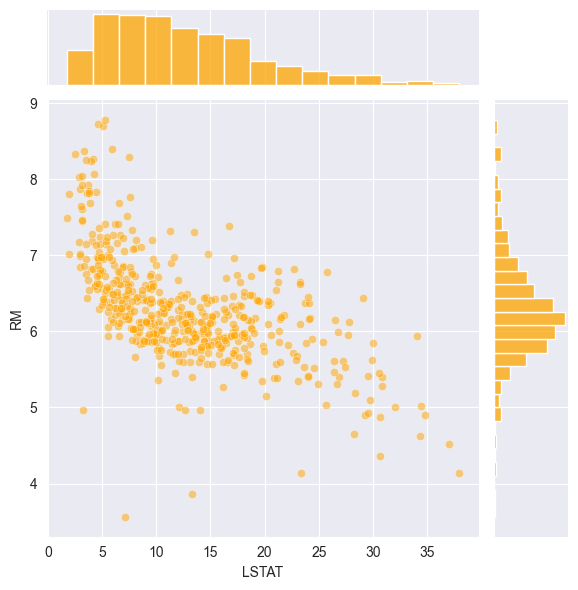

In [72]:
sns.jointplot(x=data["LSTAT"],
              y=data["RM"],
              kind="scatter",
              height=6,
              alpha=0.5,
              color='orange',
              joint_kws={'alpha': 0.5})
plt.show()

#### % of Lower Income Population versus Home Price

**Challenge**

Compare LSTAT with PRICE using Seaborn's `.jointplot()`. How does the proportion of the lower-income population in an area affect home prices?

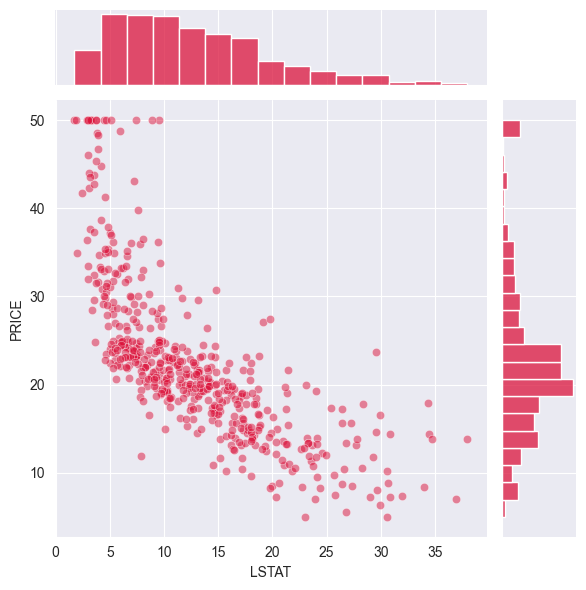

In [73]:
sns.jointplot(x=data["LSTAT"],
              y=data["PRICE"],
              kind="scatter",
              height=6,
              alpha=0.5,
              color='crimson',
              joint_kws={'alpha': 0.5})
plt.show()

#### Number of Rooms versus Home Value

**Challenge** 

Compare RM (number of rooms) with PRICE using Seaborn's `.jointplot()`. You can probably guess how the number of rooms affects home prices. 😊 

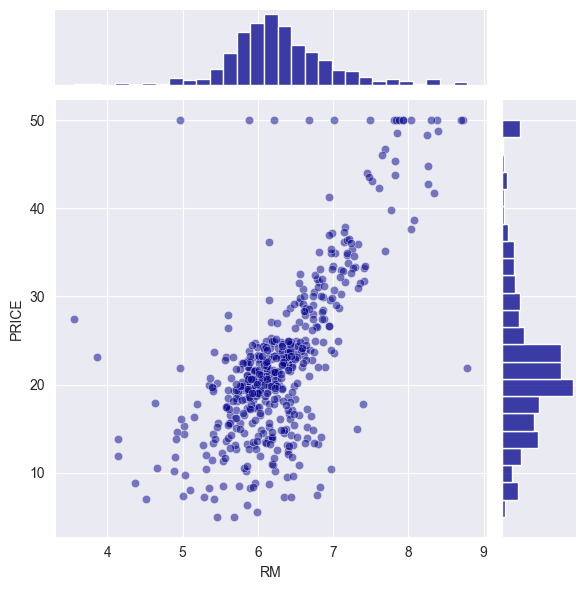

In [75]:
sns.jointplot(x=data["RM"],
              y=data["PRICE"],
              kind="scatter",
              height=6,
              alpha=0.5,
              color='darkblue',
              joint_kws={'alpha': 0.5})
plt.show()

# Split Training & Test Dataset

We *can't* use all 506 entries in our dataset to train our model. The reason is that we want to evaluate our model on data that it hasn't seen yet (i.e., out-of-sample data). That way we can get a better idea of its performance in the real world. 

**Challenge**

* Import the [`train_test_split()` function](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html) from sklearn
* Create 4 subsets: X_train, X_test, y_train, y_test
* Split the training and testing data roughly 80/20. 
* To get the same random split every time you run your notebook use `random_state=10`. This helps us get the same results every time and avoid confusion while we're learning. 


Hint: Remember, your **target** is your home PRICE, and your **features** are all the other columns you'll use to predict the price. 


In [78]:
from sklearn.model_selection import train_test_split

In [105]:
# 특성과 목표값 분리
features = data.drop(columns=['PRICE']) # PRICE 제외 하고 모든 특성을 사용
target = data['PRICE']

# 데이터 셋을 80% 훈련데이터, 20% 테스틑데이터로 변환
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=10)


print(f"훈련 데이터 크기: {X_train.shape}, {y_train.shape}")
print(f"테스트 데이터 크기: {X_test.shape}, {y_test.shape}")

# % of training set
train_pct = 100*len(X_train)/len(features)
print(f'Training data is {train_pct:.3}% of the total data.')

# % of test data set
test_pct = 100*X_test.shape[0]/features.shape[0]
print(f'Test data makes up the remaining {test_pct:0.3}%.')

훈련 데이터 크기: (404, 13), (404,)
테스트 데이터 크기: (102, 13), (102,)
Training data is 79.8% of the total data.
Test data makes up the remaining 20.2%.


# Multivariable Regression

In a previous lesson, we had a linear model with only a single feature (our movie budgets). This time we have a total of 13 features. Therefore, our Linear Regression model will have the following form:

$$ PR \hat ICE = \theta _0 + \theta _1 RM + \theta _2 NOX + \theta _3 DIS + \theta _4 CHAS ... + \theta _{13} LSTAT$$

### Run Your First Regression

**Challenge**

Use sklearn to run the regression on the training dataset. How high is the r-squared for the regression on the training data?

In [106]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [107]:
# 6️⃣ 훈련 데이터에서 R² 점수 계산
train_r2 = model.score(X_train, y_train)  # 또는 r2_score(y_train, model.predict(X_train))

print(f"훈련 데이터의 R² 점수: {train_r2:.4f}")

훈련 데이터의 R² 점수: 0.7501


### Evaluate the Coefficients of the Model

Here we do a sense check on our regression coefficients. The first thing to look for is if the coefficients have the expected sign (positive or negative). 

**Challenge** Print out the coefficients (the thetas in the equation above) for the features. Hint: You'll see a nice table if you stick the coefficients in a DataFrame. 

* We already saw that RM on its own had a positive relation to PRICE based on the scatter plot. Is RM's coefficient also positive?
* What is the sign on the LSAT coefficient? Does it match your intuition and the scatter plot above?
* Check the other coefficients. Do they have the expected sign?
* Based on the coefficients, how much more expensive is a room with 6 rooms compared to a room with 5 rooms? According to the model, what is the premium you would have to pay for an extra room? 

In [108]:
coefficients = pd.DataFrame(model.coef_, index=features.columns, columns=['Coefficient'])
print(coefficients)

         Coefficient
CRIM           -0.13
ZN              0.06
INDUS          -0.01
CHAS            1.97
NOX           -16.27
RM              3.11
AGE             0.02
DIS            -1.48
RAD             0.30
TAX            -0.01
PTRATIO        -0.82
B               0.01
LSTAT          -0.58


# 1️⃣ 방 개수(RM)의 회귀 계수 → 양수(+)
```
✅ 양수이므로 방 개수가 많을수록 집값 상승
방 개수가 1개 늘어날 때마다 집값이 약 $3,110 증가
결론: 예상과 일치함.
```
# 2️⃣ 저소득층 비율(LSTAT)의 회귀 계수 → 음수(-)
```
✅ 음수이므로 저소득층 비율이 높을수록 집값 하락
결론: 예상과 일치함.
```
# 3️⃣ 다른 주요 특성들도 예측과 대부분 일치
```
NOX(공해 정도) → 음수(-) → 공해가 심할수록 집값 하락 (✅ 예상과 일치)
DIS(고용센터 거리) → 음수(-) → 도심에서 멀수록 집값 하락 (✅ 예상과 일치)
CHAS(찰스강 근처) → 양수(+) → 강 근처일수록 집값 상승 (✅ 예상과 일치)
PTRATIO(학생당 교사 비율) → 음수(-) → 교육 환경이 좋지 않을수록 집값 하락 (✅ 예상과 일치)
```

In [109]:
rm_coefficients = coefficients.loc["RM", "Coefficient"]
print(rm_coefficients)
room_premium = rm_coefficients * (6 - 5)
print(f"방 개수가 5개에서 6개로 증가할 때 가격 상승 예상치: {room_premium:.4f} (단위: $1000)")

3.1084562454033025
방 개수가 5개에서 6개로 증가할 때 가격 상승 예상치: 3.1085 (단위: $1000)


### Analyse the Estimated Values & Regression Residuals

The next step is to evaluate our regression. How good our regression is depends not only on the r-squared. It also depends on the **residuals** - the difference between the model's predictions ($\hat y_i$) and the true values ($y_i$) inside `y_train`. 

```
predicted_values = regr.predict(X_train)
residuals = (y_train - predicted_values)
```

**Challenge**: Create two scatter plots.

The first plot should be actual values (`y_train`) against the predicted value values: 

<img src=https://i.imgur.com/YMttBNV.png height=350>

The cyan line in the middle shows `y_train` against `y_train`. If the predictions had been 100% accurate then all the dots would be on this line. The further away the dots are from the line, the worse the prediction was. That makes the distance to the cyan line, you guessed it, our residuals 😊


The second plot should be the residuals against the predicted prices. Here's what we're looking for: 

<img src=https://i.imgur.com/HphsBsj.png height=350>



In [110]:
# 예측값 계산
predicted_values = model.predict(X_train)
# 실측값과 예측값의 차이
residuals = y_train - predicted_values

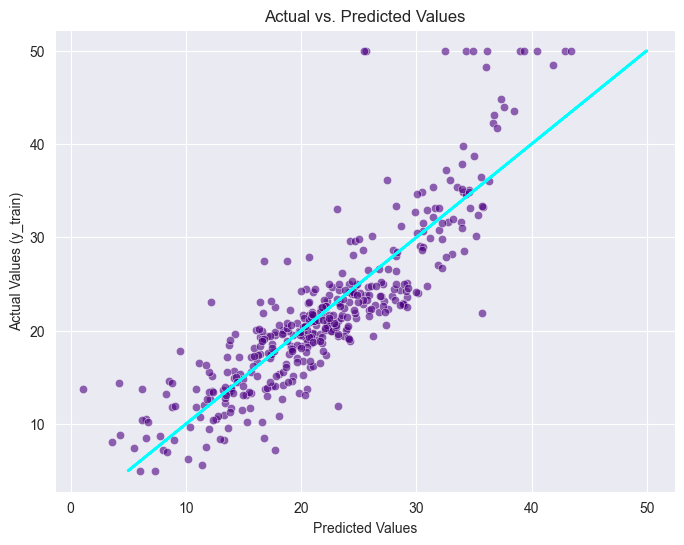

In [111]:
# 첫 번째 산점도 (실제 값 vs. 예측 값)
plt.figure(figsize=(8,6), dpi=100)
sns.scatterplot(x=predicted_values, y=y_train, c='indigo', alpha=0.6)
plt.plot(y_train, y_train, color='cyan', linewidth=2)  # 완벽한 예측선
plt.xlabel("Predicted Values")
plt.ylabel("Actual Values (y_train)")
plt.title("Actual vs. Predicted Values")
plt.show()

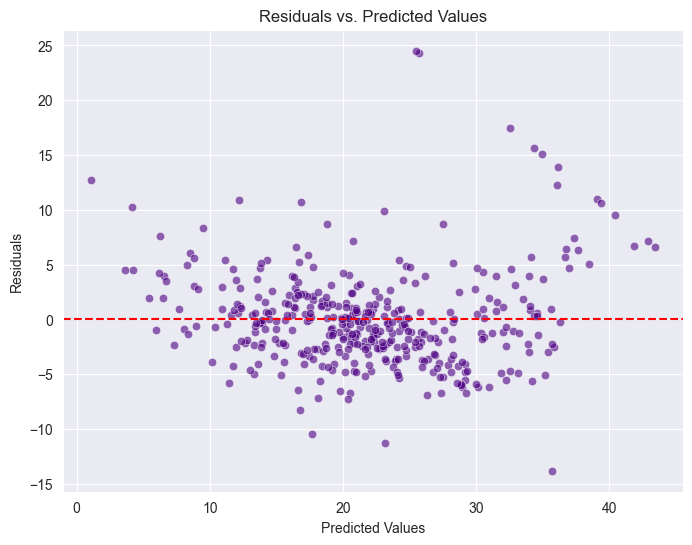

In [112]:
# 두 번째 산점도 (잔차 vs. 예측 값)
plt.figure(figsize=(8,6), dpi=100)
sns.scatterplot(x=predicted_values, y=residuals, c='indigo', alpha=0.6)
plt.axhline(y=0, color='red', linestyle='dashed')  # 잔차가 0인 기준선
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted Values")
plt.show()

Why do we want to look at the residuals? We want to check that they look random. Why? The residuals represent the errors of our model. If there's a pattern in our errors, then our model has a systematic bias.

We can analyse the distribution of the residuals. In particular, we're interested in the **skew** and the **mean**.

In an ideal case, what we want is something close to a normal distribution. A normal distribution has a skewness of 0 and a mean of 0. A skew of 0 means that the distribution is symmetrical - the bell curve is not lopsided or biased to one side. Here's what a normal distribution looks like: 

<img src=https://i.imgur.com/7QBqDtO.png height=400>

**Challenge**

* Calculate the mean and the skewness of the residuals. 
* Again, use Seaborn's `.displot()` to create a histogram and superimpose the Kernel Density Estimate (KDE)
* Is the skewness different from zero? If so, by how much? 
* Is the mean different from zero?

잔차의 평균: -0.0000
잔차의 왜도(Skewness): 1.4540


<Figure size 800x600 with 0 Axes>

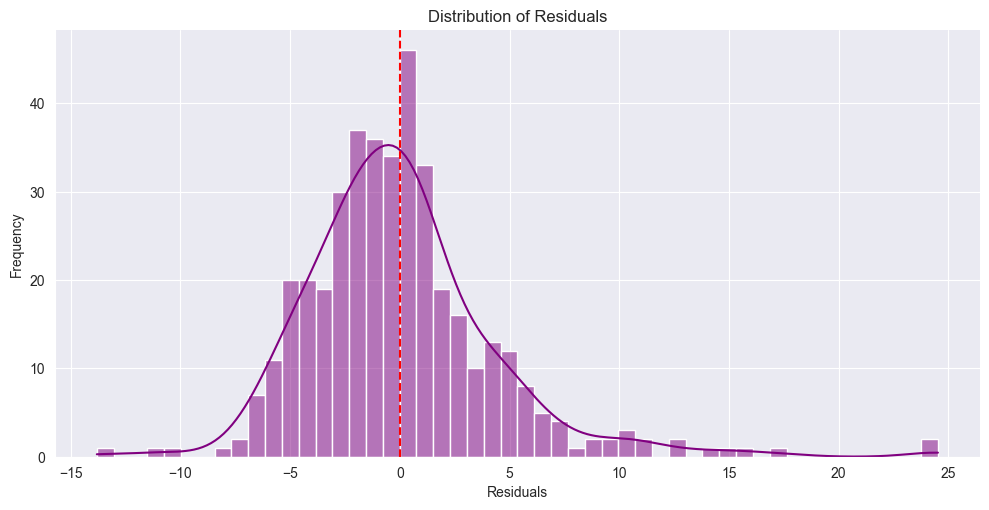

In [113]:
from scipy.stats import skew

mean_residuals = np.mean(residuals)
skewness_residuals = skew(residuals)

print(f"잔차의 평균: {mean_residuals:.4f}")
print(f"잔차의 왜도(Skewness): {skewness_residuals:.4f}")

# 8️⃣ 잔차의 분포 시각화 (히스토그램 & KDE)
plt.figure(figsize=(8,6))
sns.displot(residuals, kde=True, bins=50, aspect=2, color='purple')
plt.axvline(x=0, color='red', linestyle='dashed')  # 평균 0 기준선 추가
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Distribution of Residuals")
plt.show()

-0.0
1.46


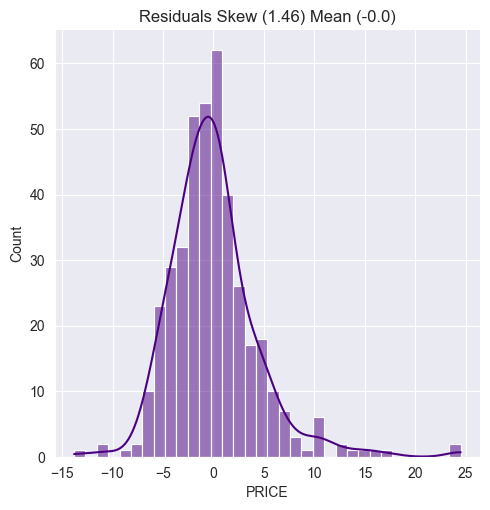

In [114]:
# Residual Distribution Chart
resid_mean = round(residuals.mean(), 2)
resid_skew = round(residuals.skew(), 2)
print(resid_mean)
print(resid_skew)

sns.displot(residuals, kde=True, color='indigo')
plt.title(f'Residuals Skew ({resid_skew}) Mean ({resid_mean})')
plt.show()

### Data Transformations for a Better Fit

We have two options at this point: 

1. Change our model entirely. Perhaps a linear model is not appropriate. 
2. Transform our data to make it fit better with our linear model. 

Let's try a data transformation approach. 

**Challenge**

Investigate if the target `data['PRICE']` could be a suitable candidate for a log transformation. 

* Use Seaborn's `.displot()` to show a histogram and KDE of the price data. 
* Calculate the skew of that distribution.
* Use [NumPy's `log()` function](https://numpy.org/doc/stable/reference/generated/numpy.log.html) to create a Series that has the log prices
* Plot the log prices using Seaborn's `.displot()` and calculate the skew. 
* Which distribution has a skew that's closer to zero? 


<Figure size 800x600 with 0 Axes>

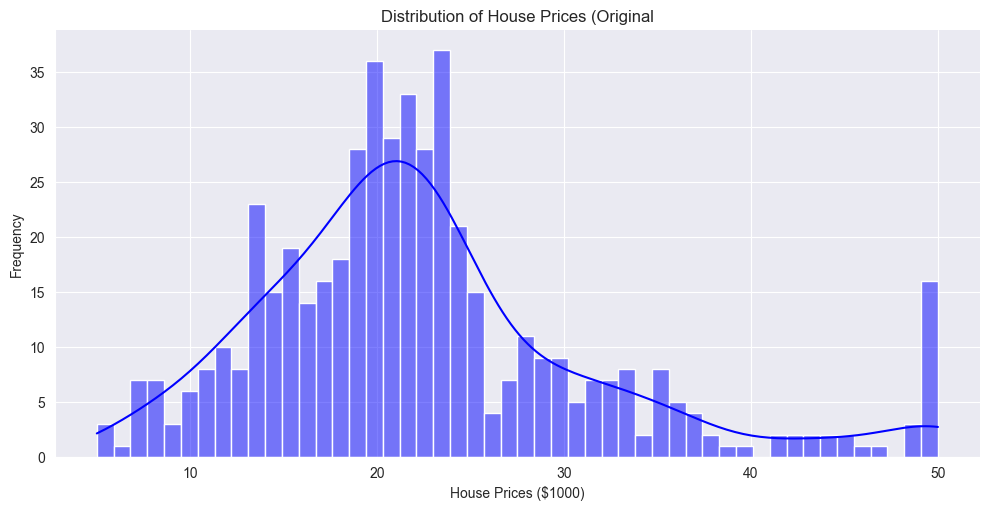

In [115]:
plt.figure(figsize=(8,6))
sns.displot(data['PRICE'], kde=True, bins=50, aspect=2, color='blue')
plt.xlabel('House Prices ($1000)')
plt.ylabel('Frequency')
plt.title('Distribution of House Prices (Original')
plt.show()

왜도 값: 1.1048


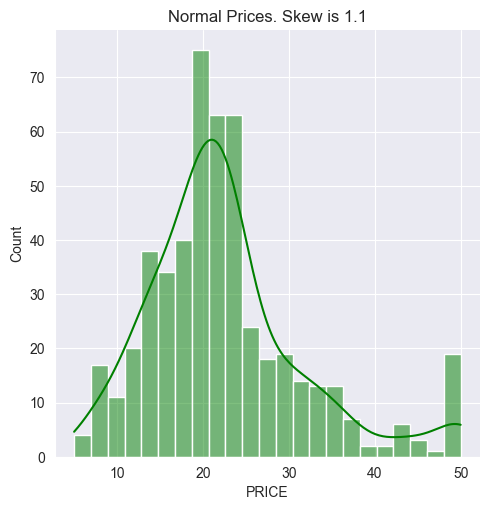

In [117]:
original_skew = skew(data['PRICE'])
print(f"왜도 값: {original_skew:.4f}")
sns.displot(data['PRICE'], kde='kde', color='green')
plt.title(f'Normal Prices. Skew is {original_skew:.3}')
plt.show()

<Figure size 800x600 with 0 Axes>

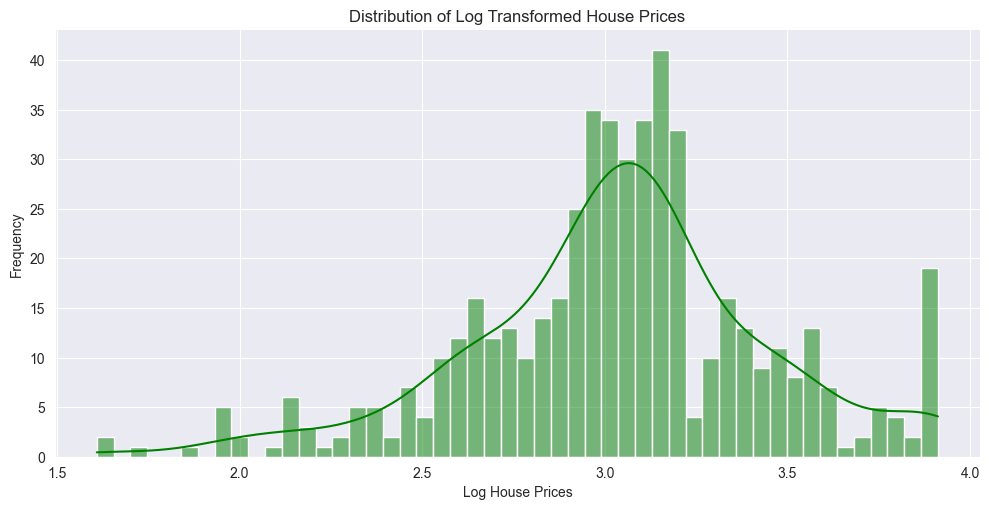

In [118]:
y_log = np.log(data['PRICE'])

# 3️⃣ 로그 변환된 데이터의 분포 확인
plt.figure(figsize=(8,6))
sns.displot(y_log, kde=True, bins=50, aspect=2, color="green")
plt.xlabel("Log House Prices")
plt.ylabel("Frequency")
plt.title("Distribution of Log Transformed House Prices")
plt.show()

로그 변환된 데이터 왜도 -0.3293


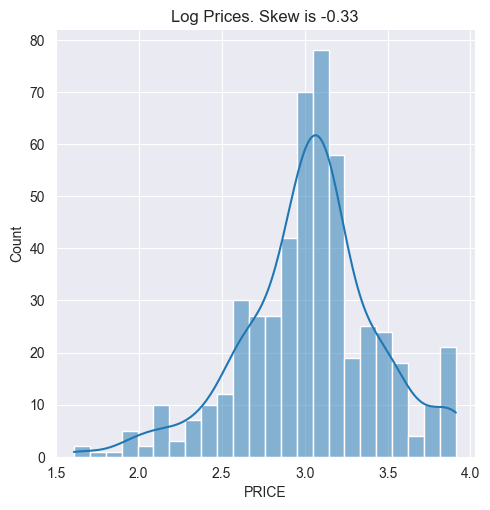

In [119]:
log_skew = skew(y_log)
print(f"로그 변환된 데이터 왜도 {log_skew:.4f}")
sns.displot(y_log, kde=True)
plt.title(f'Log Prices. Skew is {y_log.skew():.3}')
plt.show()

In [120]:
# 4️⃣ 변환 전후 비교
if abs(log_skew) < abs(original_skew):
    print("✅ 로그 변환 후 데이터가 정규분포에 더 가까움 (왜도가 0에 가까움)")
else:
    print("❌ 로그 변환 후에도 왜도가 줄어들지 않음 → 다른 변환 방법 고려 필요")

✅ 로그 변환 후 데이터가 정규분포에 더 가까움 (왜도가 0에 가까움)


#### How does the log transformation work?

Using a log transformation does not affect every price equally. Large prices are affected more than smaller prices in the dataset. Here's how the prices are "compressed" by the log transformation:

<img src=https://i.imgur.com/TH8sK1Q.png height=200>

We can see this when we plot the actual prices against the (transformed) log prices. 

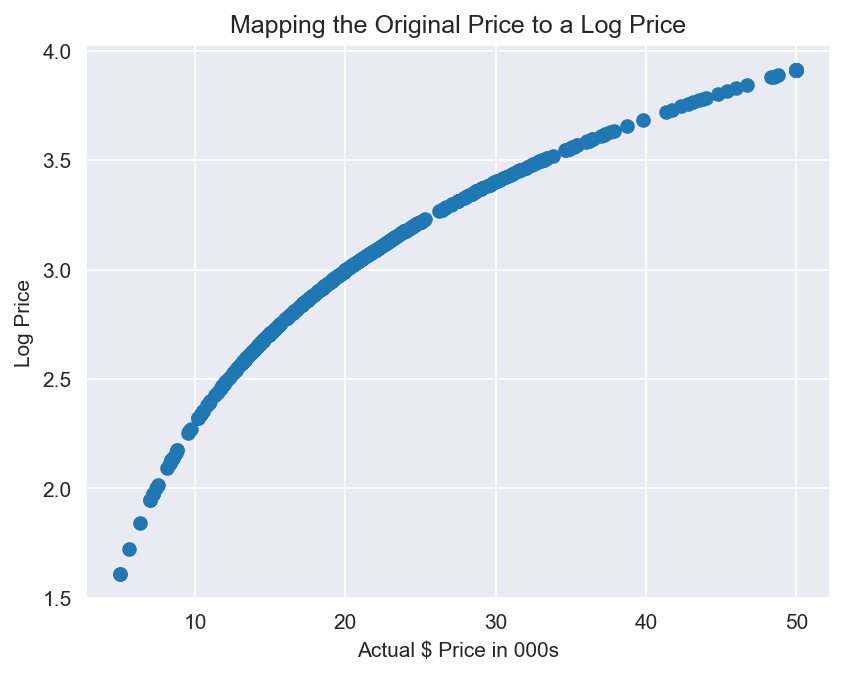

In [121]:
plt.figure(dpi=150)
plt.scatter(data.PRICE, np.log(data.PRICE))

plt.title('Mapping the Original Price to a Log Price')
plt.ylabel('Log Price')
plt.xlabel('Actual $ Price in 000s')
plt.show()

# ✅ 코드의 역할
* plt.scatter(data.PRICE, np.log(data.PRICE))
```
X축: 원본 주택 가격 (data.PRICE)
Y축: 로그 변환된 주택 가격 (np.log(data.PRICE))
결과적으로, 로그 변환이 가격을 어떻게 변형하는지 시각적으로 표현
```
* plt.title('Mapping the Original Price to a Log Price')
```
그래프 제목을 설정하여 로그 변환이 원본 가격을 어떻게 매핑하는지 설명
```
* plt.xlabel('Actual $ Price in 000s'), plt.ylabel('Log Price')
```
X축: 원본 가격
Y축: 로그 변환된 가격
```
* plt.figure(dpi=150)
```
해상도를 150 DPI로 설정하여 고화질 그래프 출력
```
* plt.show()
```
그래프를 화면에 출력
```
# 📊 그래프 해석

* 곡선 형태(Non-linear Pattern)
```
원래의 주택 가격이 클수록 로그 변환 후 압축되는 효과를 볼 수 있음
작은 값일 때는 변환 효과가 작지만, 큰 값일수록 변환 효과가 커짐
즉, 높은 가격대가 더 강하게 조정됨 → 데이터의 변동성이 줄어듦
```
* 고가 주택의 압축 효과 (Compression Effect)
```
원래 주택 가격이 높은 값일수록 로그 변환을 적용하면 값이 더 작은 범위로 변환됨
고가 주택(Outliers)이 주택 가격 예측 모델에 미치는 영향을 줄이는 효과
```
* 데이터의 선형화(Linearization)
```
로그 변환을 적용하면 데이터가 더 선형(Linear)에 가까운 관계를 형성
선형 회귀 모델이 더 적절하게 학습할 수 있도록 도움
```

## Regression using Log Prices

Using log prices instead, our model has changed to:

$$ \log (PR \hat ICE) = \theta _0 + \theta _1 RM + \theta _2 NOX + \theta_3 DIS + \theta _4 CHAS + ... + \theta _{13} LSTAT $$

**Challenge**: 

* Use `train_test_split()` with the same random state as before to make the results comparable. 
* Run a second regression, but this time use the transformed target data. 
* What is the r-squared of the regression on the training data? 
* Have we improved the fit of our model compared to before based on this measure?


# 데이터 분할: 훈련 & 테스트 데이터셋
* 📌 로그 변환된 가격을 포함한 데이터 분할

In [129]:
# 특성과 새로운 목표값 분리
features = data.drop(columns=['PRICE'])  # PRICE 제외하고 모든 특성을 사용
new_target = np.log(data['PRICE'])  # 로그 변환 적용

# 데이터 셋을 80% 훈련데이터, 20% 테스트 데이터로 분할
X_train, X_test, log_y_train, log_y_test = train_test_split(features, new_target, test_size=0.2, random_state=10)

print(f"훈련 데이터 크기: {X_train.shape}, {log_y_train.shape}")
print(f"테스트 데이터 크기: {X_test.shape}, {log_y_test.shape}")

훈련 데이터 크기: (404, 13), (404,)
테스트 데이터 크기: (102, 13), (102,)


# 다중 선형 회귀 모델 학습 (로그 변환된 가격 사용)

In [130]:
# 선형 회귀 모델 생성 및 학습
log_model = LinearRegression()
log_model.fit(X_train, log_y_train)

# 모델 성능 평가 (R² 값 확인)
r2_train = log_model.score(X_train, log_y_train)
r2_test = log_model.score(X_test, log_y_test)

print(f"✅ 로그 변환된 모델의 R² (훈련 데이터): {r2_train:.4f}")
print(f"✅ 로그 변환된 모델의 R² (테스트 데이터): {r2_test:.4f}")

✅ 로그 변환된 모델의 R² (훈련 데이터): 0.7930
✅ 로그 변환된 모델의 R² (테스트 데이터): 0.7447


# 기존 모델과 비교 (로그 변환 전 모델의 R² 확인)

In [131]:
# 기존 모델 (로그 변환 전 가격 사용)
original_model = LinearRegression()
original_model.fit(X_train, np.exp(log_y_train))  # 원래 가격을 복원한 값으로 학습

r2_original_train = original_model.score(X_train, np.exp(log_y_train))
r2_original_test = original_model.score(X_test, np.exp(log_y_test))

print(f"🔍 기존 모델의 R² (훈련 데이터): {r2_original_train:.4f}")
print(f"🔍 기존 모델의 R² (테스트 데이터): {r2_original_test:.4f}")

🔍 기존 모델의 R² (훈련 데이터): 0.7501
🔍 기존 모델의 R² (테스트 데이터): 0.6709


# 성능 비교 및 결론

In [132]:
# 성능 비교 및 결론 출력
if r2_train > r2_original_train and r2_test > r2_original_test:
    print("✅ 로그 변환 후 모델이 성능이 개선됨!")
else:
    print("❌ 로그 변환 후에도 성능 개선이 부족함 → 다른 변환 방법 고려 필요")

✅ 로그 변환 후 모델이 성능이 개선됨!


## Evaluating Coefficients with Log Prices

**Challenge**: Print out the coefficients of the new regression model. 

* Do the coefficients still have the expected sign? 
* Is being next to the river a positive based on the data?
* How does the quality of the schools affect property prices? What happens to prices as there are more students per teacher? 

Hint: Use a DataFrame to make the output look pretty. 

In [133]:
log_coefficients = pd.DataFrame(data=log_model.coef_, index=X_train.columns, columns=['Coefficient'])
log_coefficients

,Coefficient
CRIM,-0.01
ZN,0.00
INDUS,0.00
CHAS,0.08
NOX,-0.70
RM,0.07
AGE,0.00
DIS,-0.05
RAD,0.01
TAX,-0.00


In [137]:
# 강(CHAS)과 학교 품질(PTRATIO)이 주택 가격에 미치는 영향 분석
chas_coef = log_coefficients.loc['CHAS', 'Coefficient']
ptratio_coef = log_coefficients.loc['PTRATIO', 'Coefficient']

print(f"🌊 강 인접 여부 (CHAS) 계수: {chas_coef:.4f}")
print(f"🏫 학생당 교사 비율 (PTRATIO) 계수: {ptratio_coef:.4f}")

# 계수의 부호 해석
if chas_coef > 0:
    print("✅ 강(CHAS) 근처의 주택 가격이 더 높음 (긍정적 영향)")
else:
    print("❌ 강(CHAS) 근처의 주택 가격이 낮거나 영향이 적음")

if ptratio_coef < 0:
    print("✅ 학생당 교사 수가 많을수록 주택 가격이 상승 (PTRATIO가 높을수록 가격 감소)")
else:
    print("❌ 학교 품질과 주택 가격의 관계가 예상과 다름 (추가 분석 필요)")

🌊 강 인접 여부 (CHAS) 계수: 0.0803
🏫 학생당 교사 비율 (PTRATIO) 계수: -0.0348
✅ 강(CHAS) 근처의 주택 가격이 더 높음 (긍정적 영향)
✅ 학생당 교사 수가 많을수록 주택 가격이 상승 (PTRATIO가 높을수록 가격 감소)


## Regression with Log Prices & Residual Plots

**Challenge**: 

* Copy-paste the cell where you've created scatter plots of the actual versus the predicted home prices as well as the residuals versus the predicted values. 
* Add 2 more plots to the cell so that you can compare the regression outcomes with the log prices side by side. 
* Use `indigo` as the colour for the original regression and `navy` for the color using log prices.

#  결과 해석
* 1️⃣ 실제 vs 예측값 산점도
```
이상적인 경우, 모든 점들이 대각선(파란색 점선) 근처에 위치해야 함
로그 변환 모델이 더 정렬된 패턴을 보이면 → 로그 변환이 성능을 개선한 것
```
* 2️⃣ 잔차 vs 예측값 산점도
```
잔차가 특정 패턴을 보이면 → 모델이 데이터를 잘 설명하지 못하는 것
잔차가 무작위로 흩어져 있으면 → 좋은 모델
로그 변환된 모델이 잔차 패턴을 더 잘 분산시키면 → 로그 변환이 유효한 것
```

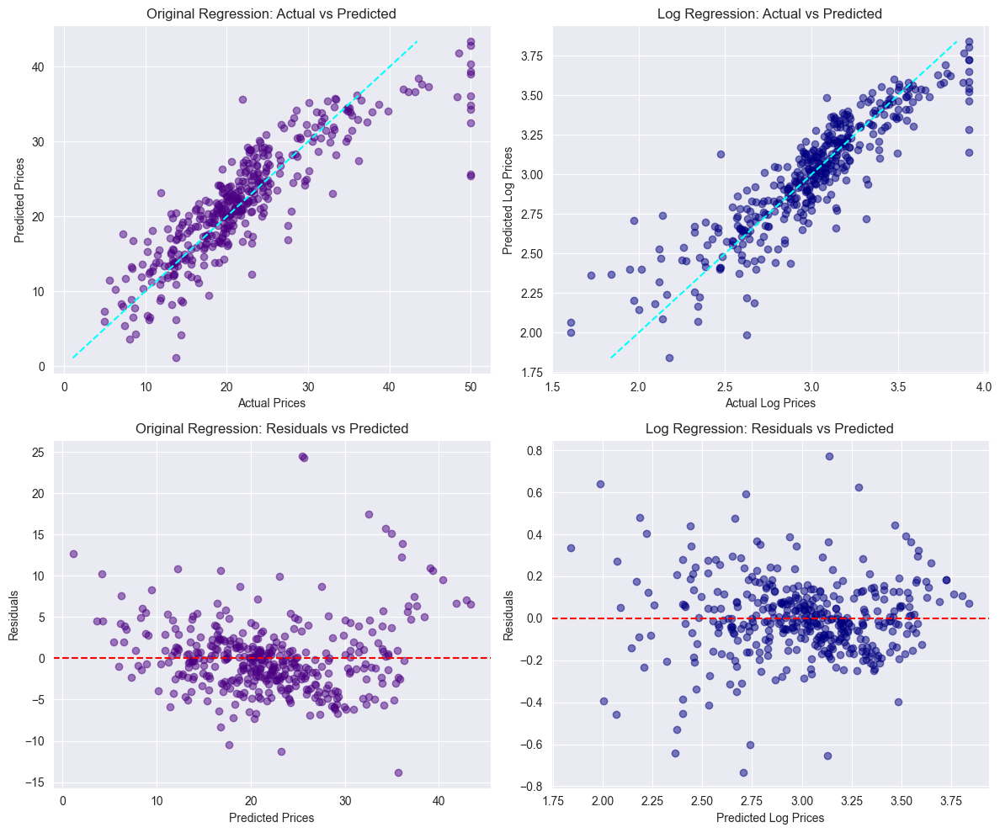

In [139]:
# 기존 모델 예측값 및 잔차
original_preds = original_model.predict(X_train)
original_residuals = np.exp(log_y_train) - original_preds  # 로그 변환 이전 값으로 복원

# 로그 변환된 모델 예측값 및 잔차
log_preds = log_model.predict(X_train)
log_residuals = log_y_train - log_preds  # 로그 변환된 상태에서의 잔차

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# 1️⃣ 원래 모델: 실제 vs 예측값 산점도
axes[0, 0].scatter(np.exp(log_y_train), original_preds, color="indigo", alpha=0.5)
axes[0, 0].plot([min(original_preds), max(original_preds)], [min(original_preds), max(original_preds)], color="cyan", linestyle="dashed")
axes[0, 0].set_title("Original Regression: Actual vs Predicted")
axes[0, 0].set_xlabel("Actual Prices")
axes[0, 0].set_ylabel("Predicted Prices")

# 2️⃣ 로그 변환 모델: 실제 vs 예측값 산점도
axes[0, 1].scatter(log_y_train, log_preds, color="navy", alpha=0.5)
axes[0, 1].plot([min(log_preds), max(log_preds)], [min(log_preds), max(log_preds)], color="cyan", linestyle="dashed")
axes[0, 1].set_title("Log Regression: Actual vs Predicted")
axes[0, 1].set_xlabel("Actual Log Prices")
axes[0, 1].set_ylabel("Predicted Log Prices")

# 3️⃣ 원래 모델: 잔차 vs 예측값 산점도
axes[1, 0].scatter(original_preds, original_residuals, color="indigo", alpha=0.5)
axes[1, 0].axhline(y=0, color="red", linestyle="dashed")
axes[1, 0].set_title("Original Regression: Residuals vs Predicted")
axes[1, 0].set_xlabel("Predicted Prices")
axes[1, 0].set_ylabel("Residuals")

# 4️⃣ 로그 변환 모델: 잔차 vs 예측값 산점도
axes[1, 1].scatter(log_preds, log_residuals, color="navy", alpha=0.5)
axes[1, 1].axhline(y=0, color="red", linestyle="dashed")
axes[1, 1].set_title("Log Regression: Residuals vs Predicted")
axes[1, 1].set_xlabel("Predicted Log Prices")
axes[1, 1].set_ylabel("Residuals")

plt.tight_layout()
plt.show()

**Challenge**: 

Calculate the mean and the skew for the residuals using log prices. Are the mean and skew closer to 0 for the regression using log prices?

In [140]:
# 로그 변환된 모델의 잔차 계산
log_residuals = log_y_train - log_model.predict(X_train)

# 잔차의 평균과 왜도(Skew) 계산
mean_log_residuals = np.mean(log_residuals)
skew_log_residuals = skew(log_residuals)

# 결과 출력
print(f"✅ 잔차의 평균 (Mean): {mean_log_residuals:.4f}")
print(f"✅ 잔차의 왜도 (Skewness): {skew_log_residuals:.4f}")

# 로그 변환 전 기존 모델의 잔차 계산
original_residuals = np.exp(log_y_train) - original_model.predict(X_train)
mean_original_residuals = np.mean(original_residuals)
skew_original_residuals = skew(original_residuals)

print(f"🔍 기존 모델의 잔차 평균: {mean_original_residuals:.4f}")
print(f"🔍 기존 모델의 잔차 왜도: {skew_original_residuals:.4f}")

# 비교
if abs(mean_log_residuals) < abs(mean_original_residuals) and abs(skew_log_residuals) < abs(skew_original_residuals):
    print("🎯 로그 변환 후 모델이 잔차 분포가 더 정규 분포에 가까움 → 더 나은 성능!")
else:
    print("⚠️ 로그 변환 후에도 잔차 분포 개선이 부족 → 다른 변환 방법 고려 필요")

✅ 잔차의 평균 (Mean): 0.0000
✅ 잔차의 왜도 (Skewness): 0.0927
🔍 기존 모델의 잔차 평균: 0.0000
🔍 기존 모델의 잔차 왜도: 1.4540
🎯 로그 변환 후 모델이 잔차 분포가 더 정규 분포에 가까움 → 더 나은 성능!


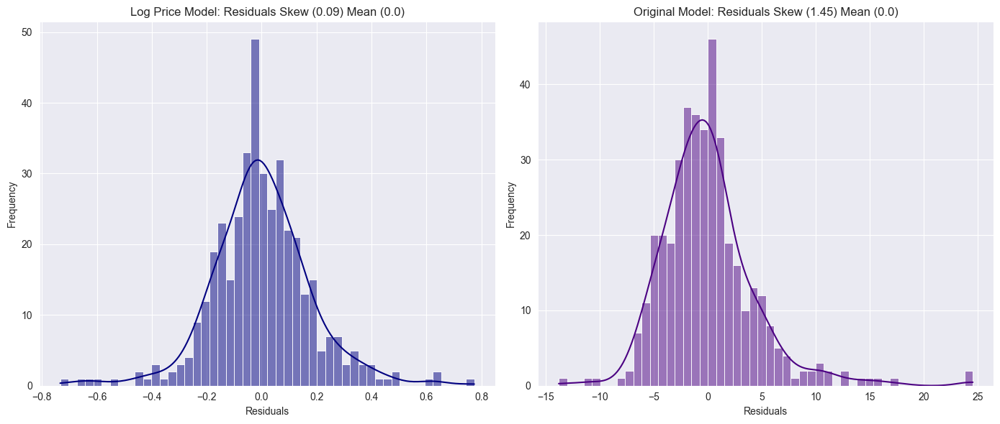

In [145]:
# 로그 변환된 모델의 잔차 계산
log_residuals = log_y_train - log_model.predict(X_train)
log_resid_mean = round(np.mean(log_residuals), 2)
log_resid_skew = round(skew(log_residuals), 2)

# 기존 모델의 잔차 계산
original_residuals = np.exp(log_y_train) - original_model.predict(X_train)
resid_mean = round(np.mean(original_residuals), 2)
resid_skew = round(skew(original_residuals), 2)

# 그래프 생성
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# 로그 변환된 모델의 잔차 분포
sns.histplot(log_residuals, kde=True, color='navy', bins=50, ax=axes[0])
axes[0].set_title(f'Log Price Model: Residuals Skew ({log_resid_skew}) Mean ({log_resid_mean})')
axes[0].set_xlabel("Residuals")
axes[0].set_ylabel("Frequency")

# 기존 모델의 잔차 분포
sns.histplot(original_residuals, kde=True, color='indigo', bins=50, ax=axes[1])
axes[1].set_title(f'Original Model: Residuals Skew ({resid_skew}) Mean ({resid_mean})')
axes[1].set_xlabel("Residuals")
axes[1].set_ylabel("Frequency")

# 그래프 출력
plt.tight_layout()
plt.show()

# Compare Out of Sample Performance

The *real* test is how our model performs on data that it has not "seen" yet. This is where our `X_test` comes in. 

**Challenge**

Compare the r-squared of the two models on the test dataset. Which model does better? Is the r-squared higher or lower than for the training dataset? Why?

In [148]:
# 1️⃣ 기존 모델의 테스트 데이터 성능 평가
r2_original_test = original_model.score(X_test, y_test)

# 2️⃣ 로그 변환된 모델의 테스트 데이터 성능 평가
r2_log_test = log_model.score(X_test, log_y_test)

# 3️⃣ 결과 출력
print(f"🔍 기존 모델의 R² (테스트 데이터): {r2_original_test:.4f}")
print(f"✅ 로그 변환된 모델의 R² (테스트 데이터): {r2_log_test:.4f}")

# 4️⃣ 비교 결과 분석
if r2_log_test > r2_original_test:
    print("✅ 로그 변환된 모델이 테스트 데이터에서 더 나은 성능을 보임!")
else:
    print("❌ 기존 모델이 테스트 데이터에서 더 나은 성능을 보임.")


🔍 기존 모델의 R² (테스트 데이터): 0.6709
✅ 로그 변환된 모델의 R² (테스트 데이터): 0.7447
✅ 로그 변환된 모델이 테스트 데이터에서 더 나은 성능을 보임!


In [147]:
print(f'Original Model Test Data r-squared: {original_model.score(X_test, y_test):.2}')
print(f'Log Model Test Data r-squared: {log_model.score(X_test, log_y_test):.2}')

Original Model Test Data r-squared: 0.67
Log Model Test Data r-squared: 0.74


# Predict a Property's Value using the Regression Coefficients

Our preferred model now has an equation that looks like this:

$$ \log (PR \hat ICE) = \theta _0 + \theta _1 RM + \theta _2 NOX + \theta_3 DIS + \theta _4 CHAS + ... + \theta _{13} LSTAT $$

The average property has the mean value for all its charactistics:

In [151]:
# Starting Point: Average Values in the Dataset
# 1️⃣ PRICE(가격) 컬럼을 제외한 모든 특성을 가져옴
features = data.drop(['PRICE'], axis=1)
# 2️⃣ 각 특성(feature)의 평균값을 계산
average_vals = features.mean().values
# 3️⃣ 평균값을 2D 배열로 변환하여 DataFrame 생성
property_stats = pd.DataFrame(data=average_vals.reshape(1, len(features.columns)), 
                              columns=features.columns)
# 4️⃣ 결과 출력 (평균적인 주택의 특성)
property_stats

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,3.61,11.36,11.14,0.07,0.55,6.28,68.57,3.80,9.55,408.24,18.46,356.67,12.65


**Challenge**

Predict how much the average property is worth using the stats above. What is the log price estimate and what is the dollar estimate? You'll have to [reverse the log transformation with `.exp()`](https://numpy.org/doc/stable/reference/generated/numpy.exp.html?highlight=exp#numpy.exp) to find the dollar value. 

In [153]:
log_price_estimate = log_model.predict(property_stats)[0]
print(f"예측된 로그 가격: {log_price_estimate:.4f}")

예측된 로그 가격: 3.0303


In [157]:
# 로그 가격을 기반으로 원래 가격 예측
price_estimate = np.exp(log_price_estimate)

# 1000 단위 변환 적용
dollar_est = price_estimate * 1000

# 결과 출력
print(f"✅ 실제 예상 주택 가격 (단위: 1000$): ${price_estimate:.2f}")
print(f"💰 원래 가격 단위 적용 후 예상 가격: ${dollar_est:,.2f}")

✅ 실제 예상 주택 가격 (단위: 1000$): $20.70
💰 원래 가격 단위 적용 후 예상 가격: $20,703.18


**Challenge**

Keeping the average values for CRIM, RAD, INDUS and others, value a property with the following characteristics:

In [179]:
# Define Property Characteristics
next_to_river = True
nr_rooms = 8
students_per_classroom = 20 
distance_to_town = 5
pollution = data.NOX.quantile(q=0.75) # high
amount_of_poverty =  data.LSTAT.quantile(q=0.25) # low

In [178]:
# Solution:
# 새로운 집의 특성 벡터 생성 (기본값은 기존 데이터의 평균값)
property_features = features.mean().to_frame().T
# 특정 조건 적용
property_features["CHAS"] = 1  # next_to_river = True (1)
property_features["RM"] = 8  # 방 개수 8개
property_features["PTRATIO"] = 20  # 교실당 학생 수
property_features["DIS"] = 5  # 도심까지 거리
property_features["NOX"] = data.NOX.quantile(q=0.75)  # 대기오염 상위 75%
property_features["LSTAT"] = data.LSTAT.quantile(q=0.25)  # 빈곤율 하위 25%

In [180]:
# 모델을 사용하여 로그 가격 예측
log_price_prediction = log_model.predict(property_stats)
print(f" Log Price Prediction: {log_price_prediction[0]:.4f}")

# 실제 가격으로 변환
price_prediction = np.exp(log_price_prediction) * 1000  # 단위 변환

print(f"💰 예측된 주택 가격: ${price_prediction[0]:,.2f}")


 Log Price Prediction: 3.2501
💰 예측된 주택 가격: $25,792.03
